Prak 7.1

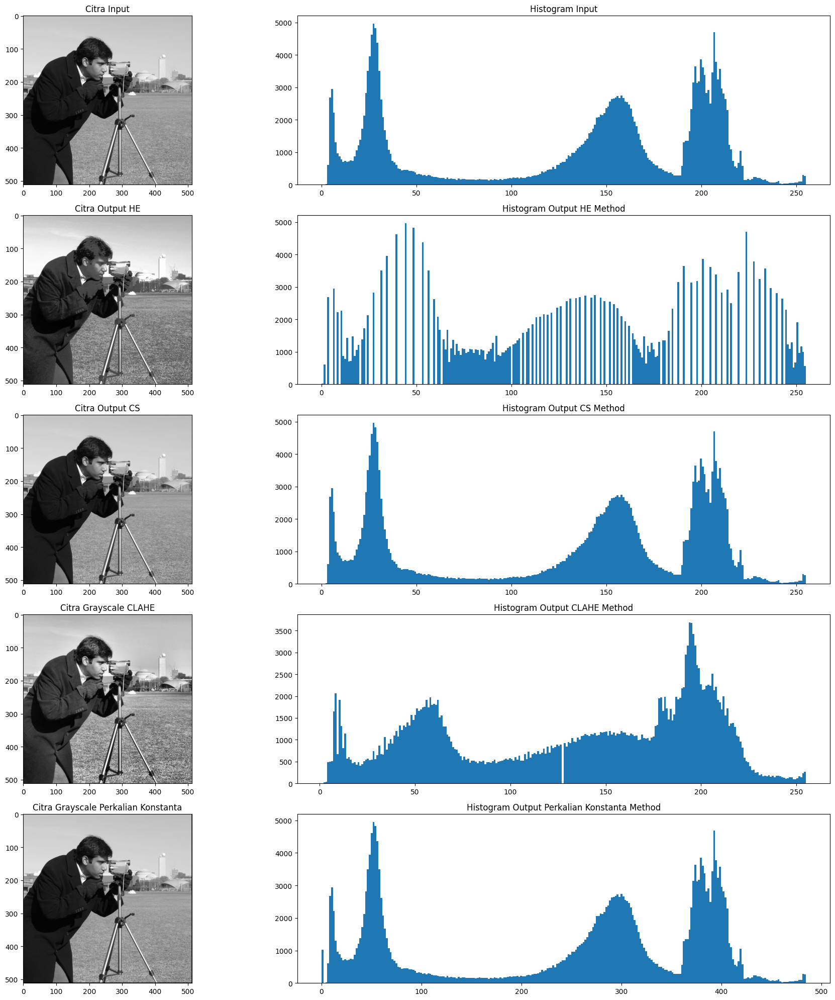

In [1]:
from cv2 import imread
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib.image as mpimg
from skimage import data
from skimage.io import imread

image = data.camera()
image_equalized = cv2.equalizeHist(image)
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))

#Apply CLAHE to the original image
image_clahe = clahe.apply(image)
# Create an empty array to store the final output
image_cs = np.zeros((image.shape[0],image.shape[1]),dtype = 'uint8')

# Apply Min-Max Contrasting
min = np.min(image)
max = np.max(image)

for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        image_cs[i,j] = 255*(image[i,j]-min)/(max-min)

copyCamera = image.copy().astype(float)

m1,n1 = copyCamera.shape
output1 = np.empty([m1, n1])

for baris in range(0, m1-1):
    for kolom in range(0, n1-1):
        a1 = baris
        b1 = kolom
        output1[a1, b1] = copyCamera[baris, kolom] * 1.9

fig, axes = plt.subplots(5, 2, figsize=(20, 20))
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title("Citra Input")
ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram Input')

ax[2].imshow(image_equalized, cmap=plt.cm.gray)
ax[2].set_title("Citra Output HE")
ax[3].hist(image_equalized.ravel(), bins=256)
ax[3].set_title('Histogram Output HE Method')

ax[4].imshow(image_cs, cmap=plt.cm.gray)
ax[4].set_title("Citra Output CS")
ax[5].hist(image_cs.ravel(), bins=256)
ax[5].set_title('Histogram Output CS Method')

ax[6].imshow(image_clahe, cmap=plt.cm.gray)
ax[6].set_title("Citra Grayscale CLAHE")
ax[7].hist(image_clahe.ravel(), bins=256)
ax[7].set_title('Histogram Output CLAHE Method')

ax[8].imshow(output1, cmap=plt.cm.gray)
ax[8].set_title("Citra Grayscale Perkalian Konstanta")
ax[9].hist(output1.ravel(), bins=256)
ax[9].set_title('Histogram Output Perkalian Konstanta Method')

fig.tight_layout()
plt.show()

Prak 7.2

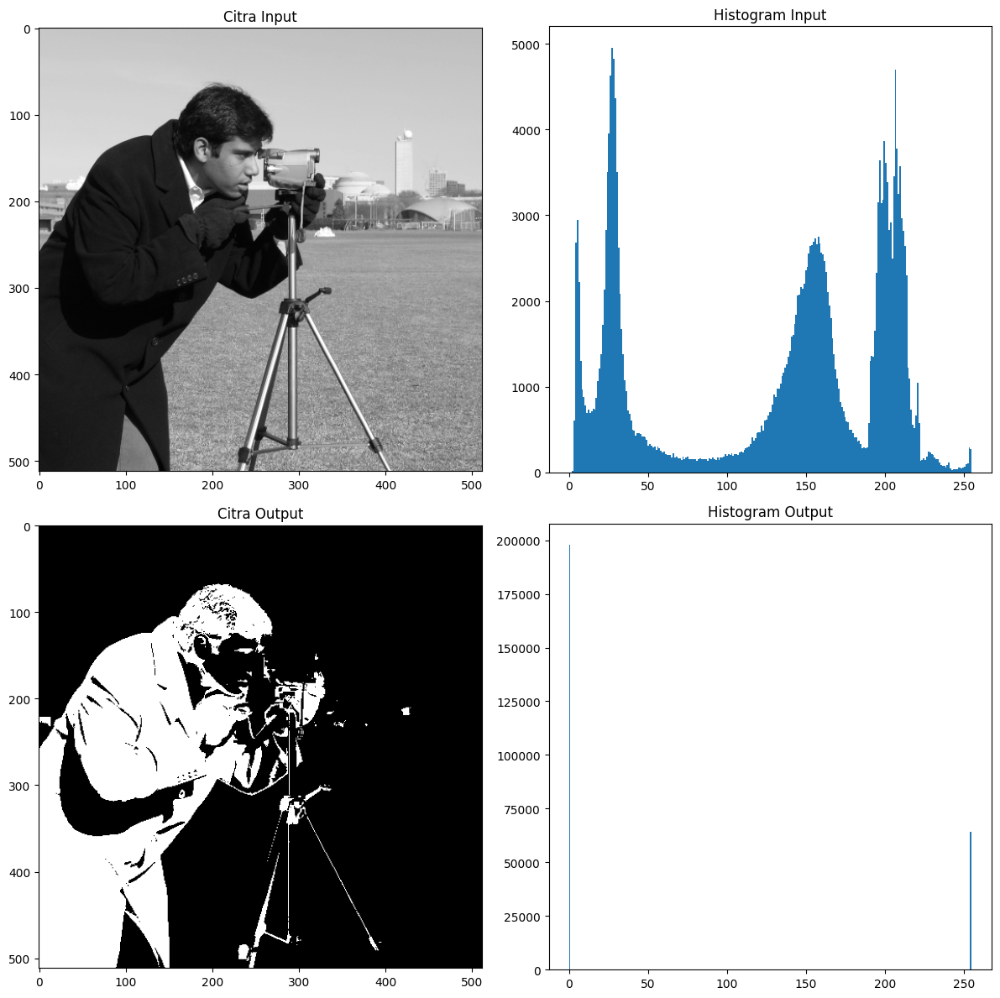

In [2]:
img = data.camera()

row, column = img.shape

img1 = np.zeros((row,column),dtype = 'uint8')
 

min_range = 10
max_range = 60
 

for i in range(row):
    for j in range(column):
        if img[i,j]>min_range and img[i,j]<max_range:
            img1[i,j] = 255
        else:
            img1[i,j] = 0
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
ax = axes.ravel()

ax[0].imshow(img, cmap=plt.cm.gray)
ax[0].set_title("Citra Input")
ax[1].hist(img.ravel(), bins=256)
ax[1].set_title('Histogram Input')

ax[2].imshow(img1, cmap=plt.cm.gray)
ax[2].set_title("Citra Output")
ax[3].hist(img1.ravel(), bins=256)
ax[3].set_title('Histogram Output')

fig.tight_layout()
plt.show()

Prak 7.3

Shape citra 1: (312, 250)
Shape citra 2: (252, 250)


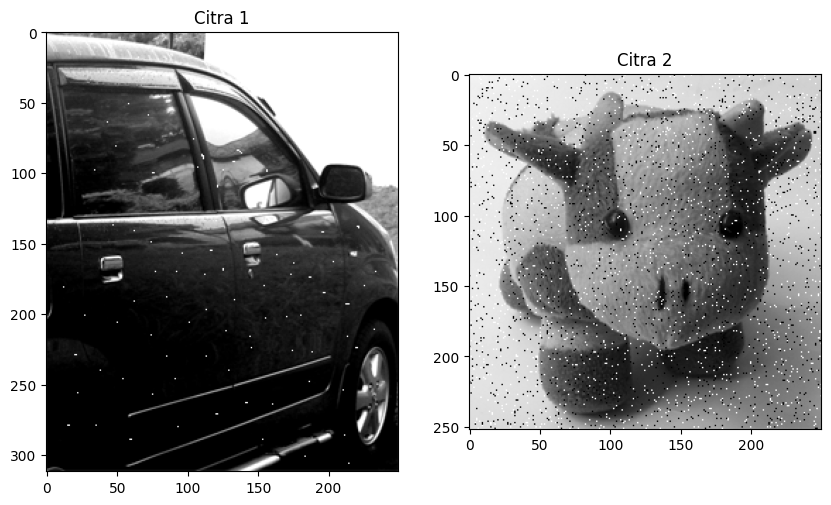

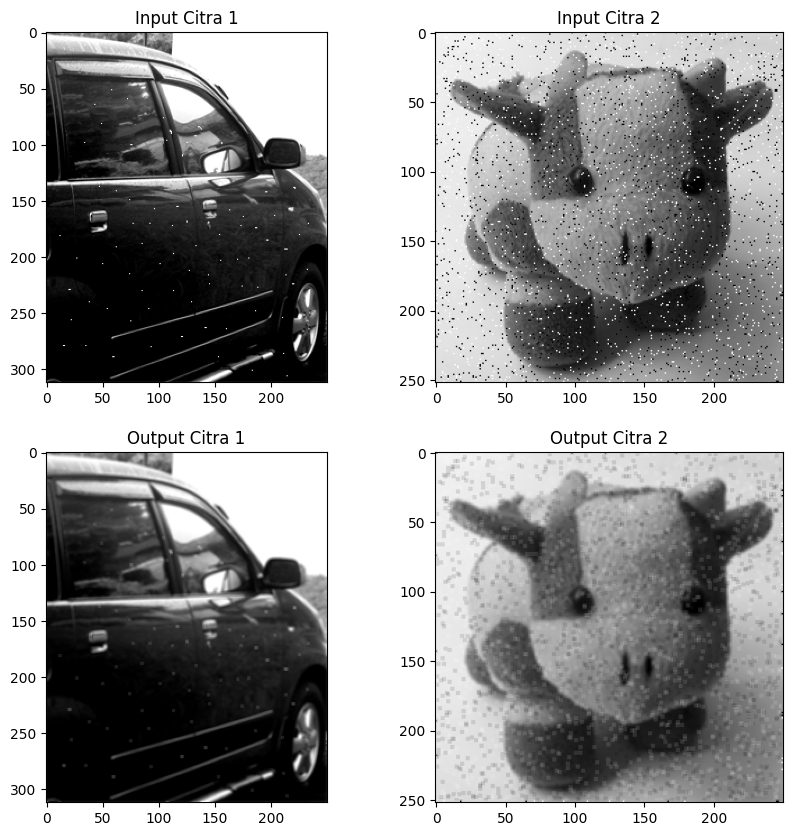

In [49]:
citra1 = imread("mobil.tif")#Membaca  gambar, 'mobil.tif'
citra2 = imread("boneka2.tif")#Membaca  gambar, 'boneka2.tif',

# Tampilkan shape citra
print('Shape citra 1:', citra1.shape)# Menampilkan bentuk (shape) dari  gambar menggunakan atribut shape pada objek citra.
print('Shape citra 2:', citra2.shape)# Menampilkan bentuk (shape) dari gambar menggunakan atribut shape pada objek citra.

# Tampilkan citra
fig, axes = plt.subplots(1, 2, figsize=(10, 10))#Membuat sebuah figure dengan 1 baris dan 2 kolom untuk menampung subplot. Ukuran figure ditentukan sebagai 10x10.
ax = axes.ravel()

ax[0].imshow(citra1, cmap='gray')# Menampilkan citra image pada subplot pertama (ax[0]) dengan menggunakan colormap gray.
ax[0].set_title("Citra 1")#Mengatur judul subplot pertama menjadi "Citra 1".
ax[1].imshow(citra2, cmap='gray')# Menampilkan citra image pada subplot pertama (ax[1]) dengan menggunakan colormap gray.
ax[1].set_title("Citra 2")#Mengatur judul subplot pertama menjadi "Citra 2".

# Buat salinan citra sebagai tipe data float
copyCitra1 = citra1.copy().astype(float)# Membuat salinan citra pertama dan kedua dengan tipe data float. Salinan ini akan digunakan untuk proses filter dan pemrosesan selanjutnya.
copyCitra2 = citra2.copy().astype(float)#Menggunakan metode copy() untuk menghindari perubahan pada citra asli, dan astype(float) untuk mengonversi tipe data menjadi float.

# Buat array kosong untuk menyimpan output
m1, n1,  = copyCitra1.shape#Menggunakan atribut shape untuk mendapatkan dimensi citra
output1 = np.empty([m1, n1])#lalu menginisialisasi array dengan np.empty() berdasarkan dimensi citra.

m2, n2,  = copyCitra2.shape#Menggunakan atribut shape untuk mendapatkan dimensi citra
output2 = np.empty([m2, n2])#lalu menginisialisasi array dengan np.empty() berdasarkan dimensi citra.

# Proses filter rerata untuk citra 1
for baris in range(1, m1 - 1):#Melakukan iterasi pada setiap baris dan kolom dalam rentang tertentu pada citra kedua
    for kolom in range(1, n1 - 1):#Melakukan proses filter rerata pada citra pertama. Pada setiap piksel citra, diambil nilai piksel sekitarnya dan disimpan dalam dataA sebagai list.
        dataA = [copyCitra1[baris - 1, kolom - 1], copyCitra1[baris - 1, kolom], copyCitra1[baris - 1, kolom + 1],#Pada setiap iterasi, nilai piksel sekitar pada citra kedua diambil dan disimpan dalam dataA sebagai list. Nilai piksel tersebut diambil dari 9 lokasi yang berdekatan dalam citra kedua.
                 copyCitra1[baris, kolom - 1], copyCitra1[baris, kolom], copyCitra1[baris, kolom + 1],
                 copyCitra1[baris + 1, kolom - 1], copyCitra1[baris + 1, kolom], copyCitra1[baris + 1, kolom + 1]]

        output1[baris, kolom] = np.mean(dataA)#emudian, rata-rata dari nilai piksel di dataA dihitung menggunakan np.mean(), dan hasilnya disimpan pada piksel yang sesuai di output1.

# Proses filter rerata untuk citra 2
for baris in range(1, m2 - 1):#Melakukan iterasi pada setiap baris dan kolom dalam rentang tertentu pada citra kedua
    for kolom in range(1, n2 - 1):# Rentangnya adalah dari baris 1 hingga m2 - 1 (dimensi citra dikurangi 1) dan dari kolom 1 hingga n2 - 1 (dimensi citra dikurangi 1).
        dataA = [copyCitra2[baris - 1, kolom - 1], copyCitra2[baris - 1, kolom], copyCitra2[baris - 1, kolom + 1],
                 copyCitra2[baris, kolom - 1], copyCitra2[baris, kolom], copyCitra2[baris, kolom + 1],
                 copyCitra2[baris + 1, kolom - 1], copyCitra2[baris + 1, kolom], copyCitra2[baris + 1, kolom + 1]]
#Menyimpan hasil rata-rata pada piksel yang sesuai dalam output2.
        output2[baris, kolom] = np.mean(dataA)#Menghitung rata-rata dari nilai piksel dalam dataA menggunakan np.mean().

# Tampilkan hasil
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
ax = axes.ravel()

ax[0].imshow(citra1, cmap='gray')# Menampilkan citra image pada subplot pertama (ax[0]) dengan menggunakan colormap gray.
ax[0].set_title("Input Citra 1")

ax[1].imshow(citra2, cmap='gray')# Menampilkan citra image pada subplot pertama (ax[1]) dengan menggunakan colormap gray.
ax[1].set_title("Input Citra 2")#Mengatur judul subplot pertama menjadi "Citra 2"

ax[2].imshow(output1, cmap='gray')# Menampilkan citra image pada subplot pertama (ax[2]) dengan menggunakan colormap gray.
ax[2].set_title("Output Citra 1")#Mengatur judul subplot pertama menjadi "Citra 3"
ax[3].imshow(output2, cmap='gray')# Menampilkan citra image pada subplot pertama (ax[3]) dengan menggunakan colormap gray.
ax[3].set_title("Output Citra 2")#Mengatur judul subplot pertama menjadi "Citra 4"

plt.show()

Prak 7.4

Shape citra 1 :  (312, 250)
Shape citra 1 :  (252, 250)
Shape copy citra 1 :  (312, 250)
Shape output citra 1 :  (312, 250)
m1 :  312
n1 :  250

Shape copy citra 2 :  (252, 250)
Shape output citra 3 :  (252, 250)
m2 :  252
n2 :  250



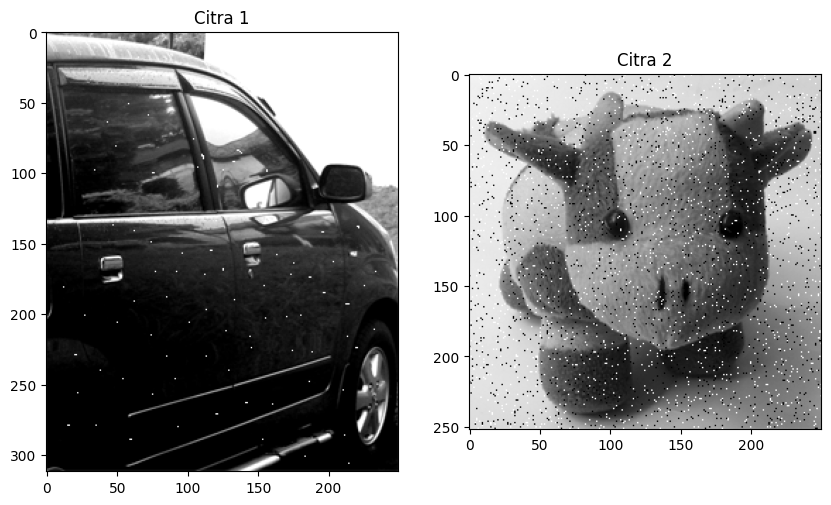

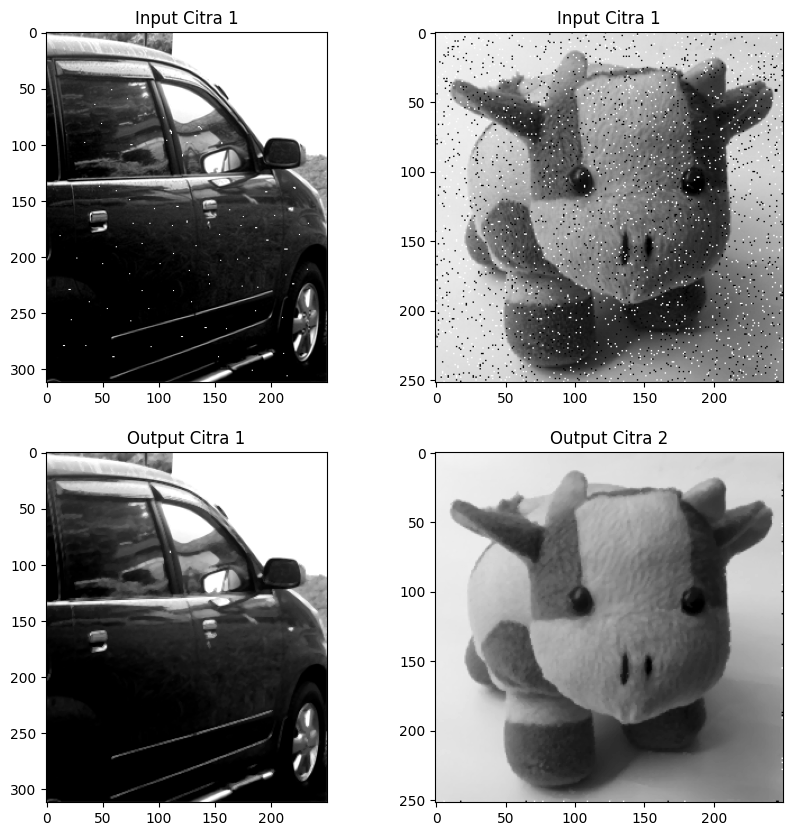

In [32]:
citra1 = imread("mobil.tif")#Citra pertama dimuat dari file "mobil.tif" dan disimpan dalam variabel citra1
citra2 = imread("boneka2.tif")#citra kedua dimuat dari file "boneka2.tif" dan disimpan dalam variabel citra2.

print('Shape citra 1 : ', citra1.shape)#citra kedua dimuat dari file "boneka2.tif" dan disimpan dalam variabel citra2.
print('Shape citra 1 : ', citra2.shape)# Informasi dimensi mencakup jumlah baris, jumlah kolom, dan jumlah saluran warna (channel) dari citra.

fig, axes = plt.subplots(1, 2, figsize=(10, 10))#Kode ini membuat sebuah figure dengan dua subplot (1 baris, 2 kolom) menggunakan subplots dari matplotlib. Ukuran figure ditentukan sebagai (10, 10) menggunakan figsize.
ax = axes.ravel()#. Setiap subplot direpresentasikan oleh elemen-elemen dalam variabel ax

ax[0].imshow(citra1, cmap = 'gray')#Pada subplot pertama (ax[0]), citra pertama (citra1) ditampilkan menggunakan imshow dengan colormap 'gray',
ax[0].set_title("Citra 1")# judul subplot diatur sebagai "Citra 1" menggunakan set_title
ax[1].imshow(citra2, cmap = 'gray')# Pada subplot kedua (ax[1]), citra kedua (citra2) ditampilkan dan diatur judulnya sebagai "Citra 2".
ax[1].set_title("Citra 2")# diatur judulnya sebagai "Citra 2".

copyCitra1 = citra1.copy()#Kode di atas menggunakan metode copy() pada citra pertama
copyCitra2 = citra2.copy()#dilakukan inisialisasi array kosong dengan ukuran yang sesuai menggunakan np.empty()

m1,n1 = copyCitra1.shape#Kode ini mengambil dimensi (shape) dari citra yang telah digandakan
output1 = np.empty([m1, n1])# Dimensi tersebut ditugaskan ke m1, n1 (untuk copyCitra1)

m2,n2 = copyCitra2.shape#Kode ini mengambil dimensi (shape) dari citra yang telah digandakan
output2 = np.empty([m2, n2])#dilakukan inisialisasi array kosong dengan ukuran yang sesuai menggunakan np.empty()
print('Shape copy citra 1 : ', copyCitra1.shape)#Kode ini mencetak dimensi (shape) dari citra yang telah digandakan (copyCitra1)
print('Shape output citra 1 : ', output1.shape)#dimensi dari array kosong (output1) yang telah diinisialisasi.

print('m1 : ',m1)# dimensi citra copyCitra1.
print('n1 : ',n1)# dimensi citra copyCitra1.
print()

print('Shape copy citra 2 : ', copyCitra2.shape)#mencetak juga dimensi citra copyCitra2
print('Shape output citra 3 : ', output2.shape)#dimensi dari array output2.
print('m2 : ',m2)#Informasi ini berguna untuk memahami jumlah baris
print('n2 : ',n2)#mlah kolom (n) dari citra atau array.
print()

for baris in range(0, m1 - 1):# dilakukan iterasi melalui setiap elemen pada citra copyCitra1 menggunakan nested loop for
    for kolom in range(0, n1 - 1):
        a1 = baris#
        b1 = kolom# Untuk setiap elemen, diambil elemen tetangganya dengan memanfaatkan indeks a1 dan b1
        dataA = [copyCitra1[a1 - 1, b1 - 1], copyCitra1[a1 - 1, b1], copyCitra1[a1 - 1, b1 + 1], #elemen-elemen tersebut disimpan dalam list dataA
                 copyCitra1[a1, b1 - 1], copyCitra1[a1, b1], copyCitra1[a1, b1 + 1], \
                 copyCitra1[a1 + 1, b1 - 1], copyCitra1[a1 + 1, b1], copyCitra1[a1 + 1, b1 + 1]]

        # Urutkan
        for i in range(1, 8):#ilakukan proses pengurutan elemen-elemen tersebut menggunakan nested loop for
            for j in range(i, 9):
                if dataA[i] > dataA[j]:
                    tmpA = dataA[i];
                    dataA[i] = dataA[j];
                    dataA[j] = tmpA;

        output1[a1, b1] = dataA[5]# Elemen yang terurut kemudian disimpan di output1 pada indeks yang sesuai.
for baris in range(0, m2 - 1):
    for kolom in range(0, n2 - 1):
        a1 = baris
        b1 = kolom
        dataA = [copyCitra2[a1 - 1, b1 - 1], copyCitra2[a1 - 1, b1], copyCitra2[a1 - 1, b1 + 1], \
                 copyCitra2[a1, b1 - 1], copyCitra2[a1, b1], copyCitra2[a1, b1 + 1], \
                 copyCitra2[a1 + 1, b1 - 1], copyCitra2[a1 + 1, b1], copyCitra2[a1 + 1, b1 + 1]]

        # Urutkan
        for i in range(1, 8):
            for j in range(i, 9):
                if dataA[i] > dataA[j]:
                    tmpA = dataA[i];
                    dataA[i] = dataA[j];
                    dataA[j] = tmpA;

        output2[a1, b1] = dataA[5]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))#Kode di atas menghasilkan plot dengan menggunakan subplots dengan 2 baris dan 2 kolom.
ax = axes.ravel()

ax[0].imshow(citra1, cmap = 'gray')#
ax[0].set_title("Input Citra 1")

ax[1].imshow(citra2, cmap = 'gray')#Citra pertama (citra1) ditampilkan pada ax[0]
ax[1].set_title("Input Citra 1")# citra kedua (citra2) ditampilkan pada ax[1]

ax[2].imshow(output1, cmap = 'gray')#
ax[2].set_title("Output Citra 1")#output1 ditampilkan pada ax[2]

ax[3].imshow(output2, cmap = 'gray')
ax[3].set_title("Output Citra 2")#output2 ditampilkan pada ax[3]

plt.show()# Setiap subplot diberi judul sesuai dengan citra yang ditampilkan. Akhirnya, plot ditampilkan menggunakan plt.show()



Prak 7.5

Shape citra 1 :  (312, 250)
Shape citra 1 :  (252, 250)
Shape copy citra 1 :  (312, 250)
Shape output citra 1 :  (312, 250)
m1 :  312
n1 :  250

Shape copy citra 2 :  (252, 250)
Shape output citra 3 :  (252, 250)
m2 :  252
n2 :  250



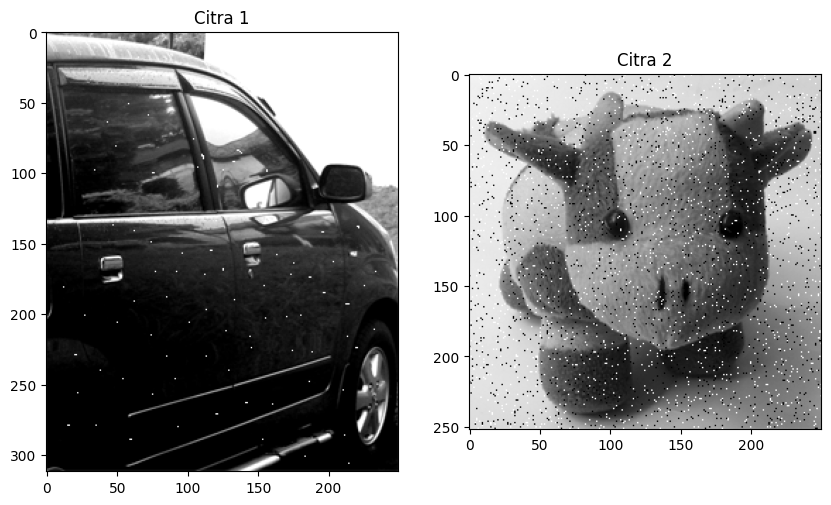

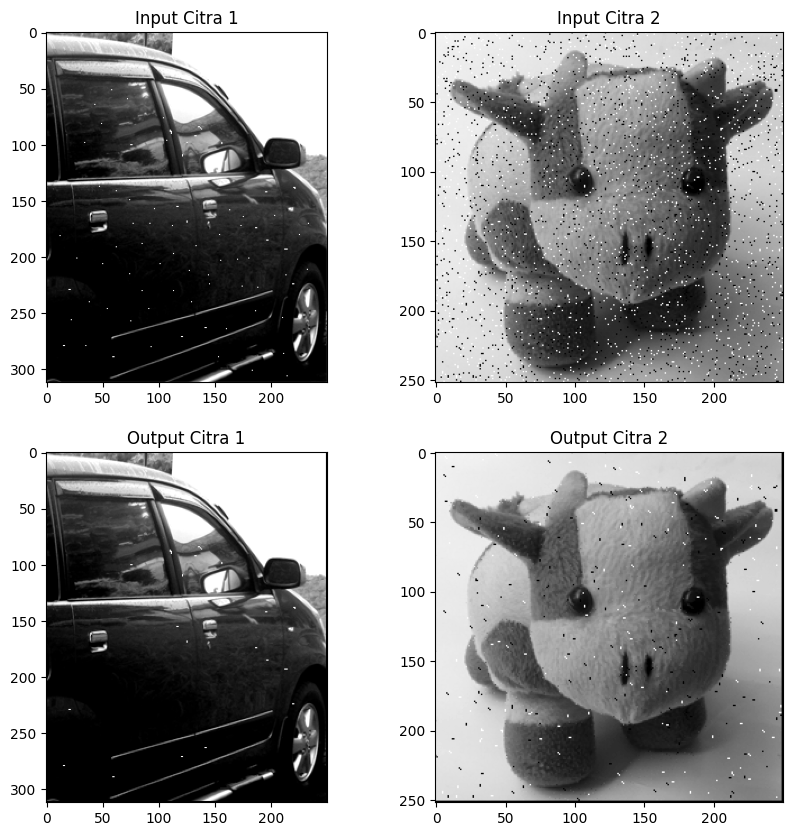

In [16]:
citra1 = imread(fname="mobil.tif")# Membaca citra dengan menggunakan fungsi imread dan menyimpannya ke variabel citra1. Citra tersebut dibaca dari file "mobil.tif".
citra2 = imread(fname="boneka2.tif")#Membaca citra dengan menggunakan fungsi imread dan menyimpannya ke variabel citra2. Citra tersebut dibaca dari file "boneka2.tif".

print('Shape citra 1 : ', citra1.shape)#Mencetak dimensi citra 1 menggunakan atribut shape untuk mengetahui ukuran citra tersebut.
print('Shape citra 1 : ', citra2.shape)# Mencetak dimensi citra 2 menggunakan atribut shape untuk mengetahui ukuran citra tersebut.

fig, axes = plt.subplots(1, 2, figsize=(10, 10))#Membuat objek figure dan axes untuk menampilkan plot. Parameter (1, 2) menunjukkan bahwa akan ada 1 baris dan 2 kolom subplot. figsize=(10, 10) mengatur ukuran gambar plot.
ax = axes.ravel()#Mengubah objek axes menjadi array 1 dimensi menggunakan fungsi ravel() agar lebih mudah diakses.

ax[0].imshow(citra1, cmap = 'gray')#Menampilkan citra 1 pada subplot pertama dengan menggunakan imshow(). Parameter cmap = 'gray' mengatur skala warna plot menjadi grayscale.
ax[0].set_title("Citra 1")#Mengatur judul untuk subplot pertama.
ax[1].imshow(citra2, cmap = 'gray')#Menampilkan citra 2 pada subplot kedua dengan menggunakan imshow().
ax[1].set_title("Citra 2")#Mengatur judul untuk subplot kedua.

copyCitra1 = citra1.copy()#Membuat salinan citra 1 menggunakan fungsi copy().
copyCitra2 = citra2.copy()#Membuat salinan citra 2 menggunakan fungsi copy().

m1,n1 = copyCitra1.shape#Menyimpan dimensi citra 1 (jumlah baris dan kolom) ke dalam variabel m1 dan n1.
output1 = np.empty([m1, n1])#Membuat array kosong dengan ukuran yang sama dengan citra 1 menggunakan fungsi empty() dari numpy.

m2,n2 = copyCitra2.shape#Menyimpan dimensi citra 2 (jumlah baris dan kolom) ke dalam variabel m2 dan n2.
output2 = np.empty([m2, n2])#Membuat array kosong dengan ukuran yang sama dengan citra 2 menggunakan fungsi empty().
print('Shape copy citra 1 : ', copyCitra1.shape)
print('Shape output citra 1 : ', output1.shape)

print('m1 : ',m1)
print('n1 : ',n1)
print()

print('Shape copy citra 2 : ', copyCitra2.shape)
print('Shape output citra 3 : ', output2.shape)
print('m2 : ',m2)
print('n2 : ',n2)
print()

for baris in range(0, m1 - 1):# Melakukan perulangan untuk setiap baris pada citra 1.
    for kolom in range(0, n1 - 1):#Melakukan perulangan untuk setiap kolom pada citra 1.

        a1 = baris#Menyimpan nilai baris ke dalam variabel a1.
        b1 = kolom#Menyimpan nilai baris ke dalam variabel a1.

        arr = np.array([copyCitra1[a1 - 1, b1 - 1], copyCitra1[a1 - 1, b1], copyCitra1[a1, b1 + 1], \
                        copyCitra1[a1, b1 - 1], copyCitra1[a1, b1 + 1], copyCitra1[a1 + 1, b1 - 1], \
                        copyCitra1[a1 + 1, b1], copyCitra1[a1 + 1, b1 + 1]])

        minPiksel = np.amin(arr);#p.amin(arr): Menemukan nilai piksel terkecil dalam array menggunakan fungsi amin() dari numpy.
        maksPiksel = np.amax(arr);#Menemukan nilai piksel terbesar dalam array menggunakan fungsi amax().

        if copyCitra1[baris, kolom] < minPiksel:#ggunakan kondisi untuk menentukan nilai piksel pada output citra 1 berdasarkan nilai piks
            output1[baris, kolom] = minPiksel
        else:
            if copyCitra1[baris, kolom] > maksPiksel:
                output1[baris, kolom] = maksPiksel
            else:
                output1[baris, kolom] = copyCitra1[baris, kolom]
for baris1 in range(0, m2 - 1):#elakukan perulangan untuk setiap baris pada citra 2.
    for kolom1 in range(0, n2 - 1):#Melakukan perulangan untuk setiap kolom pada citra 2.

        a1 = baris1# Menyimpan nilai baris1 ke dalam variabel a1.
        b1 = kolom1#Menyimpan nilai kolom1 ke dalam variabel b1.

        arr = np.array([copyCitra2[a1 - 1, b1 - 1], copyCitra2[a1 - 1, b1], copyCitra2[a1, b1 + 1],#embuat array dengan menggunakan nilai piksel dari citra 2 pada posisi yang ditentukan.
                        copyCitra2[a1, b1 - 1], copyCitra2[a1, b1 + 1], copyCitra2[a1 + 1, b1 - 1],
                        copyCitra2[a1 + 1, b1], copyCitra2[a1 + 1, b1 + 1]])

        minPiksel = np.amin(arr);#Menemukan nilai piksel terkecil dalam array menggunakan fungsi amin() dari numpy.
        maksPiksel = np.amax(arr);# Menemukan nilai piksel terbesar dalam array menggunakan fungsi amax().

        if copyCitra2[baris1, kolom1] < minPiksel:#enggunakan kondisi untuk menentukan nilai piksel pada output citra 2 berdasarkan nilai piksel pada citra 2 dan nilai piksel terkecil dan terbesar yang telah ditemukan sebelumnya.
            output2[baris1, kolom1] = minPiksel
        else:
            if copyCitra2[baris1, kolom1] > maksPiksel:
                output2[baris1, kolom1] = maksPiksel
            else:
                output2[baris1, kolom1] = copyCitra2[baris1, kolom1]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))#Membuat objek figure dan axes baru untuk menampilkan plot dengan grid 2x2 (2 baris, 2 kolom) dan ukuran gambar plot 10x10.
ax = axes.ravel()

ax[0].imshow(citra1, cmap = 'gray')
ax[0].set_title("Input Citra 1")

ax[1].imshow(citra2, cmap = 'gray')
ax[1].set_title("Input Citra 2")

ax[2].imshow(output1, cmap = 'gray')
ax[2].set_title("Output Citra 1")

ax[3].imshow(output2, cmap = 'gray')
ax[3].set_title("Output Citra 2")
plt.show()

Prak 7.5

Shape citra 1 :  (312, 250)
Shape citra 1 :  (252, 250)
Shape copy citra 1 :  (312, 250)
Shape output citra 1 :  (312, 250)
m1 :  312
n1 :  250

Shape copy citra 2 :  (252, 250)
Shape output citra 3 :  (252, 250)
m2 :  252
n2 :  250



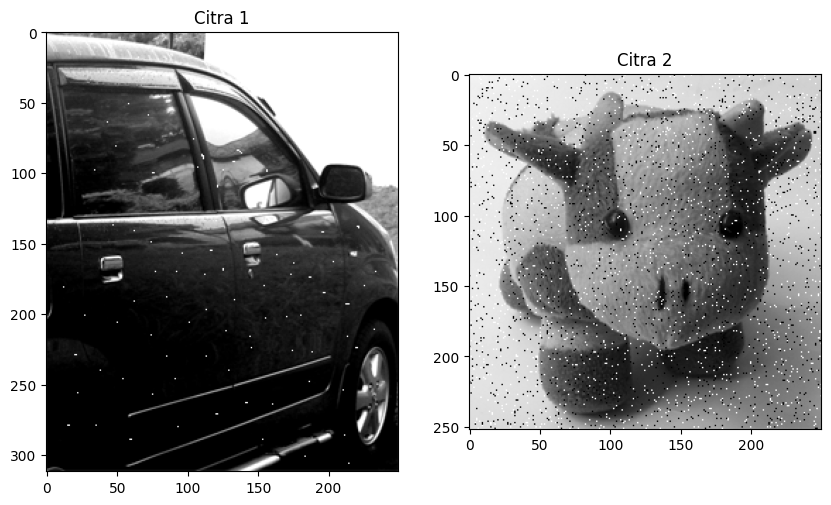

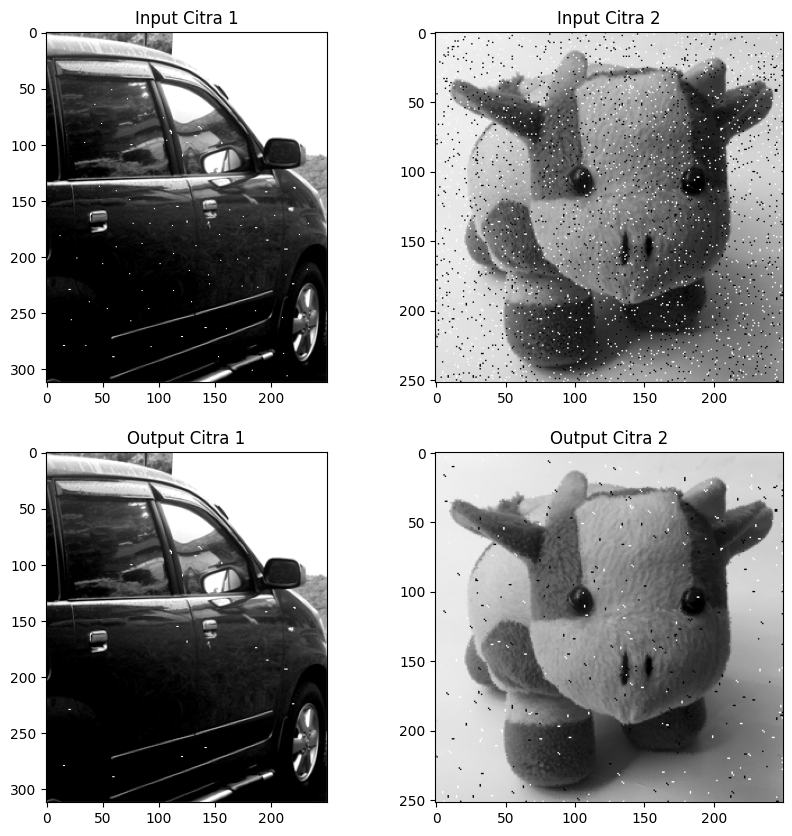

In [50]:
citra1 = imread(fname="mobil.tif")# Membaca citra dengan menggunakan fungsi imread dan menyimpannya ke variabel citra1. Citra tersebut dibaca dari file "mobil.tif".
citra2 = imread(fname="boneka2.tif")#Membaca citra dengan menggunakan fungsi imread dan menyimpannya ke variabel citra2. Citra tersebut dibaca dari file "boneka2.tif".

print('Shape citra 1 : ', citra1.shape)#Mencetak dimensi citra 1 menggunakan atribut shape untuk mengetahui ukuran citra tersebut.
print('Shape citra 1 : ', citra2.shape)# Mencetak dimensi citra 2 menggunakan atribut shape untuk mengetahui ukuran citra tersebut.

fig, axes = plt.subplots(1, 2, figsize=(10, 10))#Membuat objek figure dan axes untuk menampilkan plot. Parameter (1, 2) menunjukkan bahwa akan ada 1 baris dan 2 kolom subplot. figsize=(10, 10) mengatur ukuran gambar plot.
ax = axes.ravel()#Mengubah objek axes menjadi array 1 dimensi menggunakan fungsi ravel() agar lebih mudah diakses.

ax[0].imshow(citra1, cmap = 'gray')#Menampilkan citra 1 pada subplot pertama dengan menggunakan imshow(). Parameter cmap = 'gray' mengatur skala warna plot menjadi grayscale.
ax[0].set_title("Citra 1")#Mengatur judul untuk subplot pertama.
ax[1].imshow(citra2, cmap = 'gray')#Menampilkan citra 2 pada subplot kedua dengan menggunakan imshow().
ax[1].set_title("Citra 2")#Mengatur judul untuk subplot kedua.

copyCitra1 = citra1.copy()#Membuat salinan citra 1 menggunakan fungsi copy().
copyCitra2 = citra2.copy()#Membuat salinan citra 2 menggunakan fungsi copy().

m1,n1 = copyCitra1.shape#Menyimpan dimensi citra 1 (jumlah baris dan kolom) ke dalam variabel m1 dan n1.
output1 = np.empty([m1, n1])#Membuat array kosong dengan ukuran yang sama dengan citra 1 menggunakan fungsi empty() dari numpy.

m2,n2 = copyCitra2.shape#Menyimpan dimensi citra 2 (jumlah baris dan kolom) ke dalam variabel m2 dan n2.
output2 = np.empty([m2, n2])#Membuat array kosong dengan ukuran yang sama dengan citra 2 menggunakan fungsi empty().
print('Shape copy citra 1 : ', copyCitra1.shape)
print('Shape output citra 1 : ', output1.shape)

print('m1 : ',m1)
print('n1 : ',n1)
print()

print('Shape copy citra 2 : ', copyCitra2.shape)
print('Shape output citra 3 : ', output2.shape)
print('m2 : ',m2)
print('n2 : ',n2)
print()

for baris in range(0, m1 - 1):# Melakukan perulangan untuk setiap baris pada citra 1.
    for kolom in range(0, n1 - 1):#Melakukan perulangan untuk setiap kolom pada citra 1.

        a1 = baris#Menyimpan nilai baris ke dalam variabel a1.
        b1 = kolom#Menyimpan nilai baris ke dalam variabel a1.

        arr = np.array([copyCitra1[a1 - 1, b1 - 1], copyCitra1[a1 - 1, b1], copyCitra1[a1, b1 + 1], \
                        copyCitra1[a1, b1 - 1], copyCitra1[a1, b1 + 1], copyCitra1[a1 + 1, b1 - 1], \
                        copyCitra1[a1 + 1, b1], copyCitra1[a1 + 1, b1 + 1]])

        minPiksel = np.amin(arr);#p.amin(arr): Menemukan nilai piksel terkecil dalam array menggunakan fungsi amin() dari numpy.
        maksPiksel = np.amax(arr);#Menemukan nilai piksel terbesar dalam array menggunakan fungsi amax().

        if copyCitra1[baris, kolom] < minPiksel:#ggunakan kondisi untuk menentukan nilai piksel pada output citra 1 berdasarkan nilai piks
            output1[baris, kolom] = minPiksel
        else:
            if copyCitra1[baris, kolom] > maksPiksel:
                output1[baris, kolom] = maksPiksel
            else:
                output1[baris, kolom] = copyCitra1[baris, kolom]
for baris1 in range(0, m2 - 1):#elakukan perulangan untuk setiap baris pada citra 2.
    for kolom1 in range(0, n2 - 1):#Melakukan perulangan untuk setiap kolom pada citra 2.

        a1 = baris1# Menyimpan nilai baris1 ke dalam variabel a1.
        b1 = kolom1#Menyimpan nilai kolom1 ke dalam variabel b1.

        arr = np.array([copyCitra2[a1 - 1, b1 - 1], copyCitra2[a1 - 1, b1], copyCitra2[a1, b1 + 1],#embuat array dengan menggunakan nilai piksel dari citra 2 pada posisi yang ditentukan.
                        copyCitra2[a1, b1 - 1], copyCitra2[a1, b1 + 1], copyCitra2[a1 + 1, b1 - 1],
                        copyCitra2[a1 + 1, b1], copyCitra2[a1 + 1, b1 + 1]])

        minPiksel = np.amin(arr);#Menemukan nilai piksel terkecil dalam array menggunakan fungsi amin() dari numpy.
        maksPiksel = np.amax(arr);# Menemukan nilai piksel terbesar dalam array menggunakan fungsi amax().

        if copyCitra2[baris1, kolom1] < minPiksel:#enggunakan kondisi untuk menentukan nilai piksel pada output citra 2 berdasarkan nilai piksel pada citra 2 dan nilai piksel terkecil dan terbesar yang telah ditemukan sebelumnya.
            output2[baris1, kolom1] = minPiksel
        else:
            if copyCitra2[baris1, kolom1] > maksPiksel:
                output2[baris1, kolom1] = maksPiksel
            else:
                output2[baris1, kolom1] = copyCitra2[baris1, kolom1]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))#Membuat objek figure dan axes baru untuk menampilkan plot dengan grid 2x2 (2 baris, 2 kolom) dan ukuran gambar plot 10x10.
ax = axes.ravel()

ax[0].imshow(citra1, cmap = 'gray')
ax[0].set_title("Input Citra 1")

ax[1].imshow(citra2, cmap = 'gray')
ax[1].set_title("Input Citra 2")

ax[2].imshow(output1, cmap = 'gray')
ax[2].set_title("Output Citra 1")

ax[3].imshow(output2, cmap = 'gray')
ax[3].set_title("Output Citra 2")
plt.show()

Prak 7.6 Highpass Filter

(636, 512, 3)


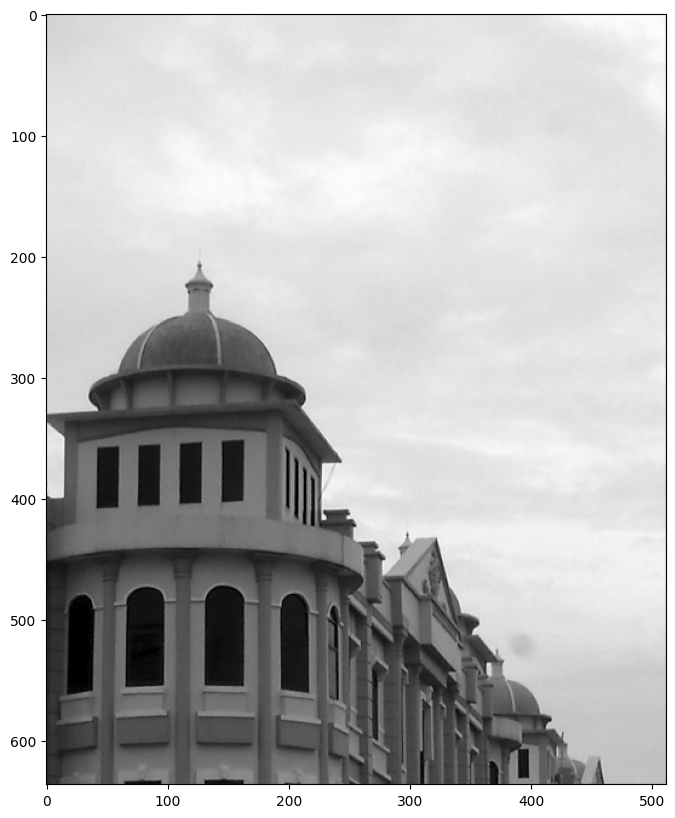

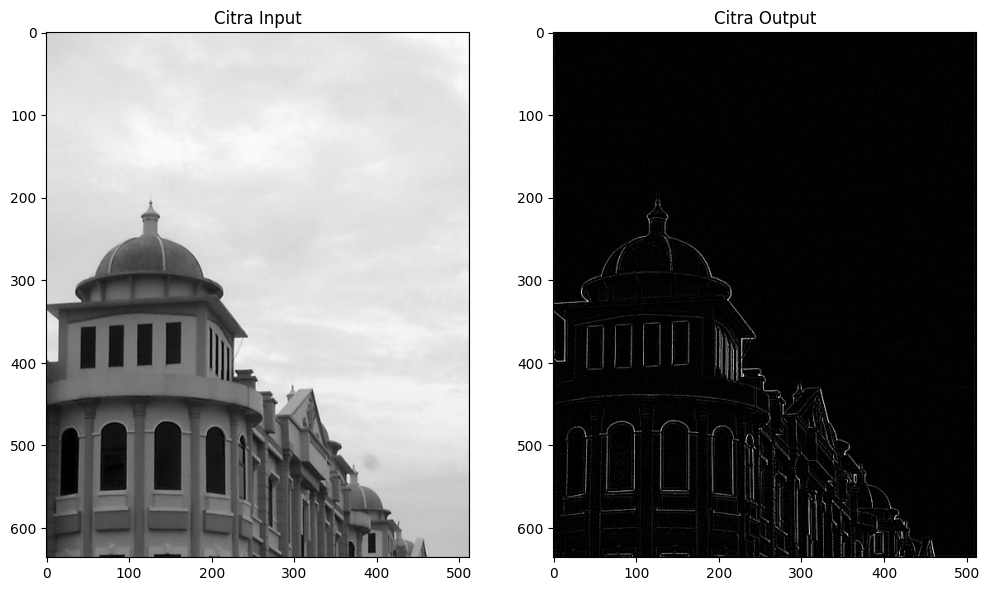

In [51]:
# Load input images
citra1 = cv2.imread('gedung.tif')#Membaca citra 'Bandung.png' menggunakan fungsi cv2.imread() dan hasilnya disimpan dalam variabel citra1. Citra ini akan digunakan dalam proses selanjutnya.
print(citra1.shape)#Menampilkan bentuk (shape) citra citra1 menggunakan atribut shape. Hasilnya berupa tuple yang menyatakan dimensi citra dalam format (tinggi, lebar, jumlah_channel).

plt.imshow(citra1, cmap='gray')# Menampilkan citra citra1 menggunakan fungsi plt.imshow(). Argumen citra1 digunakan untuk menampilkan citra, sedangkan cmap='gray' digunakan untuk menampilkan citra dalam skala abu-abu.

kernel = np.array([[-1, 0, -1],#Membuat kernel/filter 3x3 dengan menggunakan numpy array. Kernel ini digunakan untuk melakukan operasi konvolusi pada citra.
                   [0, 4, 0],
                   [-1, 0, -1]])#Nilai-nilai pada kernel akan mempengaruhi hasil akhir dari operasi konvolusi.

citraOutput = cv2.filter2D(citra1, -1, kernel)#Melakukan operasi konvolusi pada citra citra1 menggunakan fungsi cv2.filter2D()

fig, axes = plt.subplots(1, 2, figsize=(12, 12))#Membuat figure dengan dua subplot menggunakan fungsi plt.subplots(). Argumen pertama adalah jumlah baris subplot, argumen kedua adalah jumlah kolom subplot, dan argumen ketiga adalah ukuran figure dalam satuan inch.
ax = axes.ravel()#Membuat variabel ax yang merupakan versi flat dari axes. Hal ini berguna untuk mempermudah pengindeksan saat melakukan plotting pada setiap subplot.

ax[0].imshow(citra1, cmap = 'gray')# Menampilkan citra image pada subplot pertama (ax[0]) dengan menggunakan colormap gray.
ax[0].set_title("Citra Input")#Mengatur judul subplot pertama menjadi "Citra input"
ax[1].imshow(citraOutput, cmap = 'gray')# Menampilkan citra image pada subplot pertama (ax[0]) dengan menggunakan colormap gray.
ax[1].set_title("Citra Output")#Mengatur judul subplot pertama menjadi "Citra output"
plt.show()

Prak 7.7 Highpass Filter

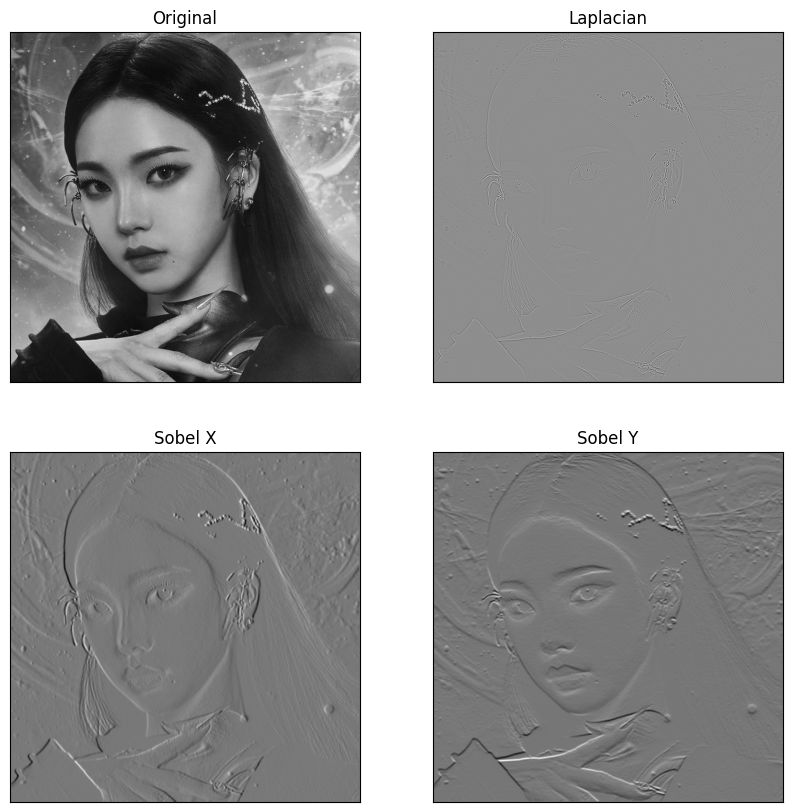

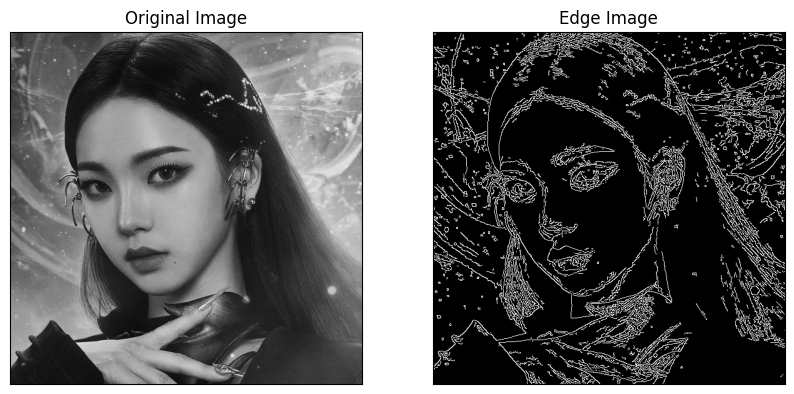

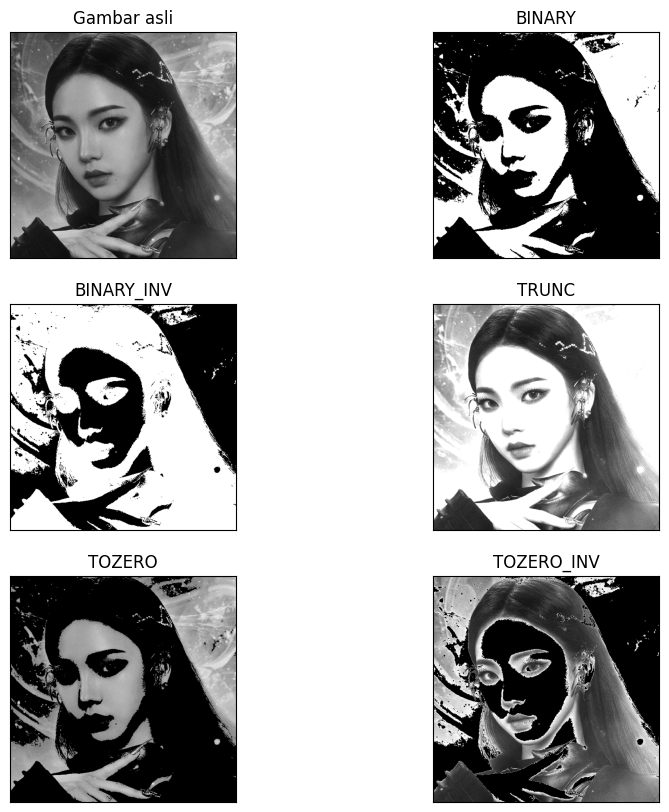

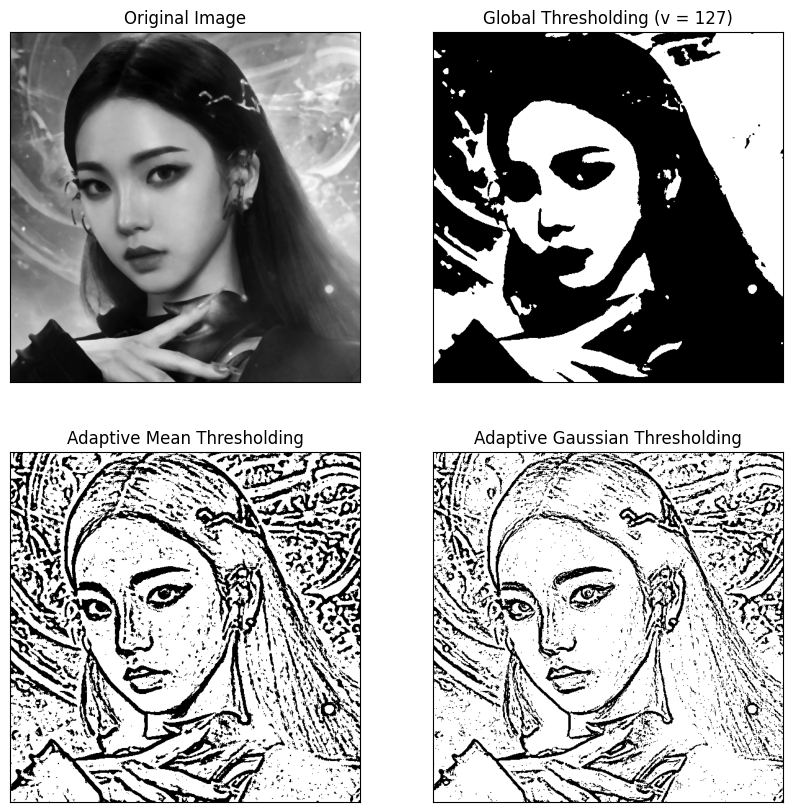

In [40]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


# memanggil citra sebagai grayscale (argument 0)
img = cv2.imread('karina.jpg',0)

# menerapkan algoritma high-pass filtering:
# laplacian
laplacian = cv2.Laplacian(img,cv2.CV_64F)

# sobel dengan ukuran kernel 5
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

# Catatan:
# CV_64F pada contoh di atas menunjukkan nilai bit dari citra
# yang dihasilkan serta tipe datanya (F = Float)

# perbesar ukuran hasil plotting
plt.rcParams["figure.figsize"] = (10,10)


# menampilkan hasil filter
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')#Baris ini menentukan subplot pertama dalam grid 2x2. Fungsi plt.subplot() digunakan untuk membuat subplot dengan parameter (jumlah baris, jumlah kolom, nomor subplot).
plt.title('Original'), plt.xticks([]), plt.yticks([])#plt.title('Original'), plt.xticks([]), plt.yticks([]): Baris ini menambahkan judul 'Original' pada subplot pertama menggunakan fungsi plt.title(). Fungsi plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan tanda sumbu (ticks) pada subplot pertama.
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')#ungsi plt.imshow() digunakan untuk menampilkan gambar laplacian (hasil Laplacian filtering) dalam subplot tersebut dengan colormap 'gray'.
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])#Fungsi plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan tanda sumbu (ticks) pada subplot kedua.
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')#Fungsi plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan tanda sumbu (ticks) pada subplot kedua.
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])#Baris ini menentukan subplot ketiga dalam grid 2x2. Fungsi plt.subplot() digunakan untuk membuat subplot dengan parameter (jumlah baris, jumlah kolom, nomor subplot).
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')#Baris ini menambahkan judul 'Sobel X' pada subplot ketiga menggunakan fungsi plt.title()
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])#Baris ini menentukan subplot keempat dalam grid 2x2. Fungsi plt.subplot() digunakan untuk membuat subplot dengan parameter (jumlah baris, jumlah kolom, nomor subplot).
plt.show()

# memanggil citra sebagai grayscale (argument 0)
img = cv2.imread('karina.jpg',0)

# memanggil fungsi Canny Edges dengan argument (citra, nilai_min, nilai_max)
edges = cv2.Canny(img,50,100)

plt.subplot(121),plt.imshow(img,cmap = 'gray')#Baris ini menentukan subplot pertama dalam grid 1x2. Fungsi plt.subplot() digunakan untuk membuat subplot dengan parameter (jumlah baris, jumlah kolom, nomor subplot).
plt.title('Original Image'), plt.xticks([]), plt.yticks([])#Baris ini menambahkan judul 'Original Image' pada subplot pertama menggunakan fungsi plt.title(). Fungsi plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan tanda sumbu (ticks) pada subplot pertama.
plt.subplot(122),plt.imshow(edges,cmap = 'gray')# Baris ini menentukan subplot kedua dalam grid 1x2. Fungsi plt.subplot() digunakan untuk membuat subplot dengan parameter (jumlah baris, jumlah kolom, nomor subplot).
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])#plt.title('Edge Image'), plt.xticks([]), plt.yticks([]): Baris ini menambahkan judul 'Edge Image' pada subplot kedua menggunakan fungsi plt.title().

plt.show()
# membaca gambar baymax
img = cv2.imread('karina.jpg',0)

# Hitungan threshold.
# Perhatikan nilai ambang batas bawah dan atas dari tiap fungsi
# yang diberikan
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)#Baris ini menggunakan fungsi cv2.threshold() untuk menerapkan binary thresholding pada citra img
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)#mirip dengan baris sebelumnya, tetapi kali ini diterapkan binary inverse thresholding. Piksel dengan intensitas di atas ambang batas diatur menjadi 0 (hitam), sedangkan piksel dengan intensitas di bawah ambang batas diatur menjadi 255 (putih)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)#Baris ini menerapkan truncation thresholding pada citra img. Piksel dengan intensitas di atas ambang batas diatur menjadi ambang batas itu sendiri (127 dalam hal ini), sedangkan piksel dengan intensitas di bawah ambang batas tidak mengalami perubahan.
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)#Baris ini menerapkan thresholding to zero pada citra img. Piksel dengan intensitas di bawah ambang batas diatur menjadi 0 (hitam), sedangkan piksel dengan intensitas di atas atau sama dengan ambang batas tidak mengalami perubahan.
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)#: Baris ini mirip dengan baris sebelumnya, tetapi kali ini diterapkan thresholding to zero inverse.

# menampilkan hasil
titles = ['Gambar asli','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

# menampilkan beberapa gambar sekaligus
for i in range(6):
    # 3 baris, 2 kolom
    plt.subplot(3,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

# masih menggunakan variabel img yang sama
#img = cv2.imread('images/baymax.jpg',0)

# digunakan median blur untuk menghaluskan tepi objek pada citra
# ini diperlukan agar thresholding memberikan hasil lebih baik
img = cv2.medianBlur(img,5)

# Lakukan Thresholding
# Binary Threshold
ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# Adaptive Threshold dengan Mean
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)

# Adaptive Threshold dengan Gaussian
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)


# Plotting
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

# menampilkan hasil
for i in range(4):#Melakukan iterasi sebanyak 4 kali, karena terdapat 4 gambar yang akan ditampilkan.
    plt.subplot(2,2,i+1)#Membuat subplot dengan grid 2x2 (2 baris, 2 kolom) dan mengatur posisi subplot yang akan digunakan pada iterasi saat ini.
    plt.imshow(images[i],'gray')#nampilkan gambar dengan menggunakan fungsi imshow().
    plt.title(titles[i])#Memberikan judul pada subplot berdasarkan judul yang ada pada indeks i dari daftar titles.
    plt.xticks([]),plt.yticks([])#Menghilangkan label sumbu x dan y pada subplot.
plt.show()

Prak 7.7 Histogram

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


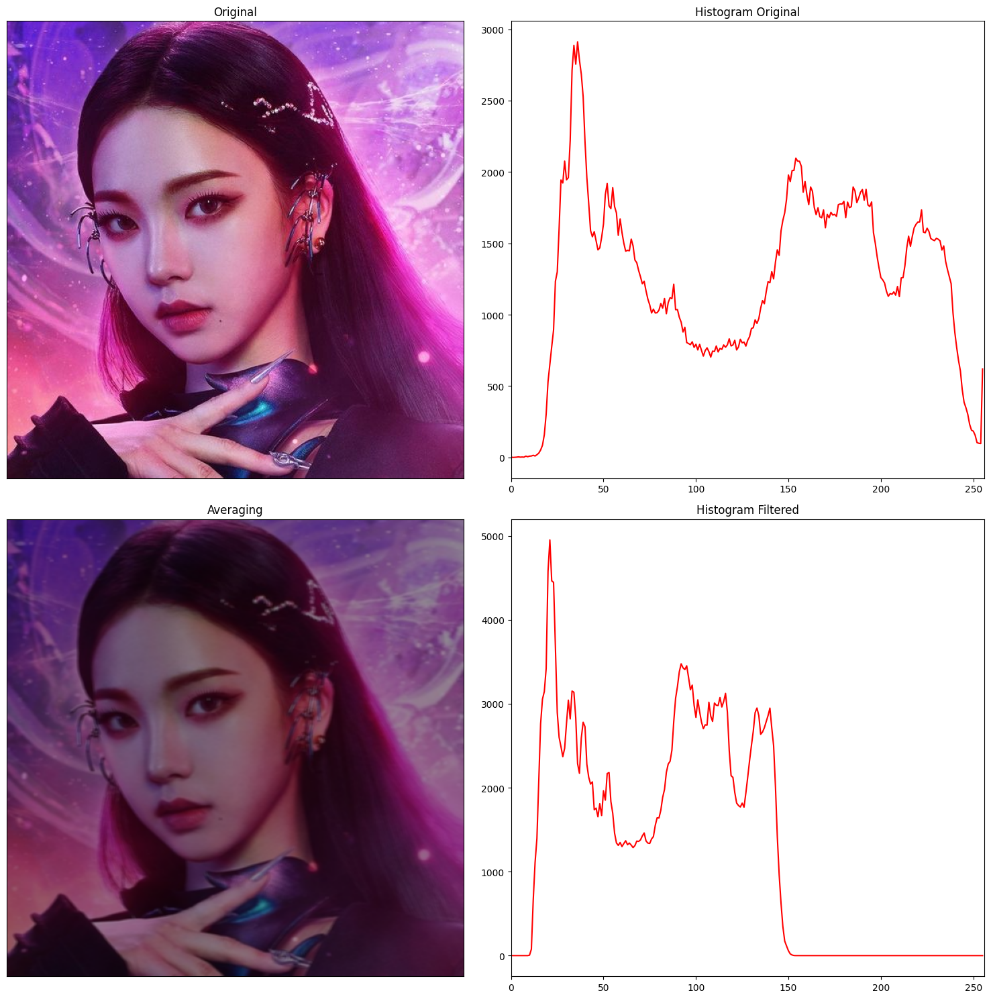

In [41]:
# Baca gambar
img = cv2.imread('karina.jpg')# Membaca citra 'aadc.jpeg' menggunakan fungsi cv2.imread() dan hasilnya disimpan dalam variabel img. Citra ini akan digunakan dalam proses selanjutnya.

# Konversi BGR ke RGB
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)#engonversi format warna citra dari BGR (Blue-Green-Red) menjadi RGB (Red-Green-Blue) menggunakan fungsi cv2.cvtColor().

# Buat kernel: matriks berukuran 3 x 5
kernel = np.ones((3, 5), np.float32) * 0.04#Membuat kernel/filter dengan menggunakan numpy array. Kernel ini berukuran 3x5 dan diisi dengan nilai 0.04.
print(kernel)#Kernel ini akan digunakan dalam operasi filtering.

# Lakukan filtering
filtered_img = cv2.filter2D(img, -1, kernel)#Melakukan operasi filtering pada citra img menggunakan fungsi cv2.filter2D()

# perbesar ukuran hasil plotting jika diperlukan
plt.rcParams["figure.figsize"] = (15, 15)#Mengatur ukuran figure yang akan digunakan untuk plotting menggunakan matplotlib. Angka (15, 15) menunjukkan ukuran figure dalam satuan inch.

# plot pertama, gambar asli
plt.subplot(221), plt.imshow(rgb_img), plt.title('Original')#Membuat subplot pertama dengan menggunakan fungsi plt.subplot(). Angka (221) menunjukkan letak subplot dalam bentuk grid 2x2, yaitu pada baris pertama dan kolom pertama. plt.imshow() digunakan untuk menampilkan citra rgb_img pada subplot tersebut. plt.title() digunakan untuk memberikan judul pada subplot.
plt.xticks([]), plt.yticks([])#plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan penanda sumbu pada plot.

# Hitung histogram gambar asli
hist_img = cv2.calcHist([img], [0], None, [256], [0, 256])#Menghitung histogram citra menggunakan fungsi cv2.calcHist(). Argumen pertama adalah citra yang akan dihitung histogramnya (img).

plt.subplot(222), plt.plot(hist_img, color='r')#embuat subplot kedua dengan menggunakan fungsi plt.subplot(). Angka (222) menunjukkan letak subplot dalam bentuk grid 2x2, yaitu pada baris pertama dan kolom kedua. plt.plot() digunakan untuk menggambar plot histogram dengan menggunakan data hist_img. color='r' digunakan untuk mengatur warna garis plot menjadi merah.
plt.title('Histogram Original')#plt.title() digunakan untuk memberikan judul pada subplot.
plt.xlim([0, 256])#plt.xlim([0, 256]) digunakan untuk mengatur batas sumbu x pada plot histogram.

# Ubah warna hasil filter menjadi asli (BGR)
filtered_rgb_img = cv2.cvtColor(filtered_img, cv2.COLOR_BGR2RGB)#Mengonversi format warna citra hasil filtering dari BGR menjadi RGB menggunakan fungsi cv2.cvtColor()

# kedua, hasil filter
plt.subplot(223), plt.imshow(filtered_rgb_img), plt.title('Averaging')##Membuat subplot pertama dengan menggunakan fungsi plt.subplot(). Angka (221) menunjukkan letak subplot dalam bentuk grid 2x2, yaitu pada baris pertama dan kolom pertama. plt.imshow() digunakan untuk menampilkan citra rgb_img pada subplot tersebut. plt.title() digunakan untuk memberikan judul pada subplot.
plt.xticks([]), plt.yticks([])#plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan penanda sumbu pada plot.

# Hitung histogram gambar hasil filter
hist_filtered_img = cv2.calcHist([filtered_img], [0], None, [256], [0, 256])#: Menghitung histogram dari citra hasil filtering (filtered_img) menggunakan fungsi cv2.calcHist(). Argumen pertama adalah citra yang akan dihitung histogramnya, yaitu filtered_img.

plt.subplot(224), plt.plot(hist_filtered_img, color='r')#embuat subplot kedua dengan menggunakan fungsi plt.subplot(). Angka (222) menunjukkan letak subplot dalam bentuk grid 2x2, yaitu pada baris pertama dan kolom kedua. plt.plot() digunakan untuk menggambar plot histogram dengan menggunakan data hist_img. color='r' digunakan untuk mengatur warna garis plot menjadi merah.
plt.title('Histogram Filtered')#plt.title() digunakan untuk memberikan judul pada subplot.
plt.xlim([0, 256])#plt.xlim([0, 256]) digunakan untuk mengatur batas sumbu x pada plot histogram.

# Plot!
plt.tight_layout()#Mengatur layout plot agar lebih rapi menggunakan fungsi plt.tight_layout()
plt.show()#enampilkan semua plot yang telah dibuat menggunakan fungsi plt.show().

Prak 7.7 HIstogram 2

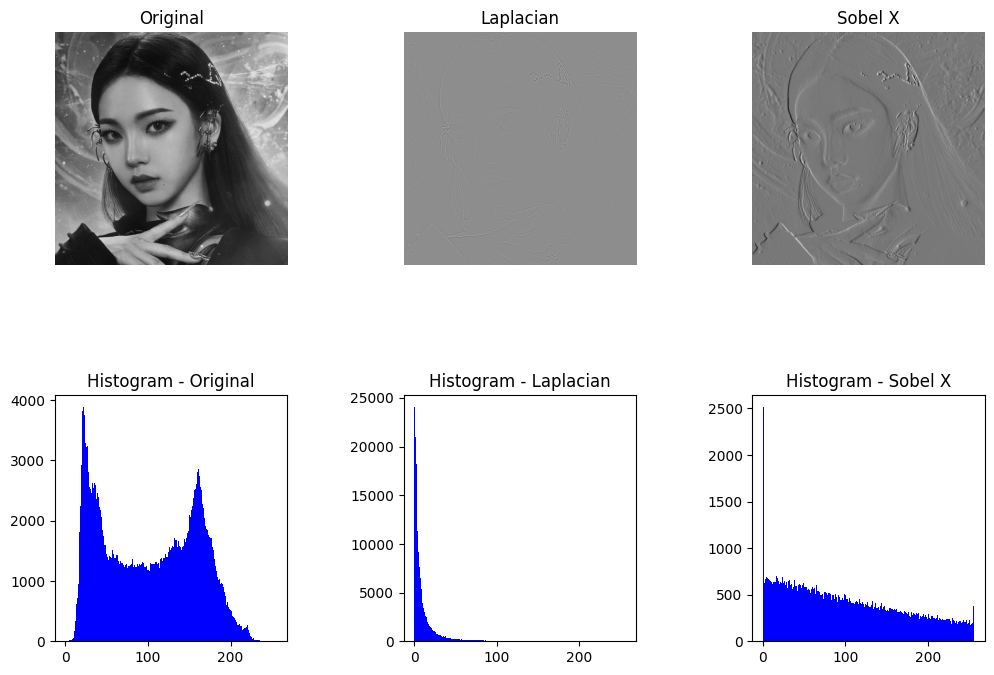

In [42]:
img = cv2.imread('karina.jpg', 0)

# menerapkan algoritma high-pass filtering:
# laplacian
laplacian = cv2.Laplacian(img, cv2.CV_64F)

# sobel dengan ukuran kernel 5
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)

# perbesar ukuran hasil plotting
plt.rcParams["figure.figsize"] = (12, 8)

# Membagi layout menjadi 2 baris dan 3 kolom
fig, axs = plt.subplots(2, 3)

# Menampilkan gambar asli
axs[0, 0].imshow(img, cmap='gray')
axs[0, 0].set_title('Original')
axs[0, 0].axis('off')

# Menampilkan histogram gambar asli
axs[1, 0].hist(img.ravel(), 256, [0, 256], color='blue')
axs[1, 0].set_title('Histogram - Original')

# Menampilkan gambar Laplacian
axs[0, 1].imshow(laplacian, cmap='gray')
axs[0, 1].set_title('Laplacian')
axs[0, 1].axis('off')

# Menampilkan histogram Laplacian
axs[1, 1].hist(laplacian.ravel(), 256, [0, 256], color='blue')
axs[1, 1].set_title('Histogram - Laplacian')

# Menampilkan gambar Sobel X
axs[0, 2].imshow(sobelx, cmap='gray')
axs[0, 2].set_title('Sobel X')
axs[0, 2].axis('off')

# Menampilkan histogram Sobel X
axs[1, 2].hist(sobelx.ravel(), 256, [0, 256], color='blue')
axs[1, 2].set_title('Histogram - Sobel X')

# Atur jarak antar subplot menjadi 0.5
plt.subplots_adjust(wspace=0.5, hspace=0.5)

# Menampilkan plot
plt.show()

Prak 7.7 Low Pass Filter

[[0.09 0.09 0.09 0.09 0.09]
 [0.09 0.09 0.09 0.09 0.09]
 [0.09 0.09 0.09 0.09 0.09]]


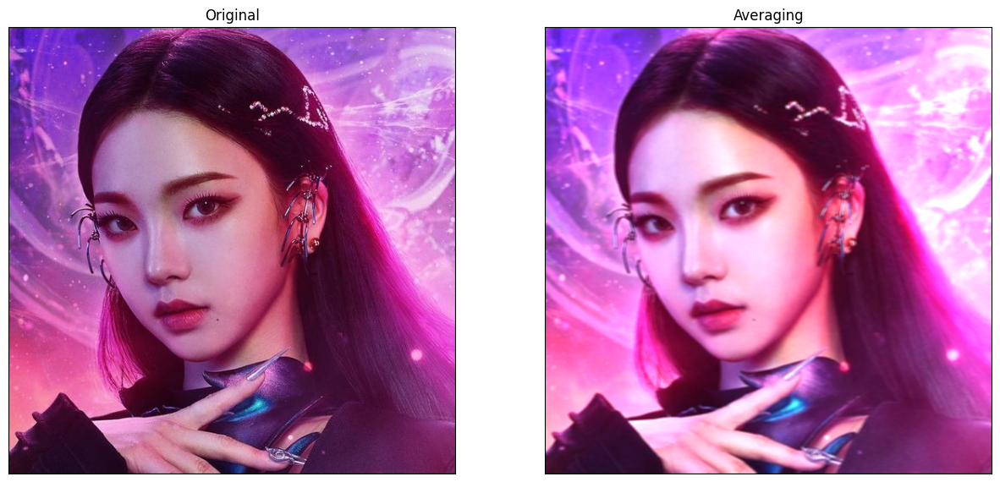

[[0.04 0.04 0.04]
 [0.04 0.08 0.04]
 [0.04 0.04 0.04]]


(([], []), ([], []))

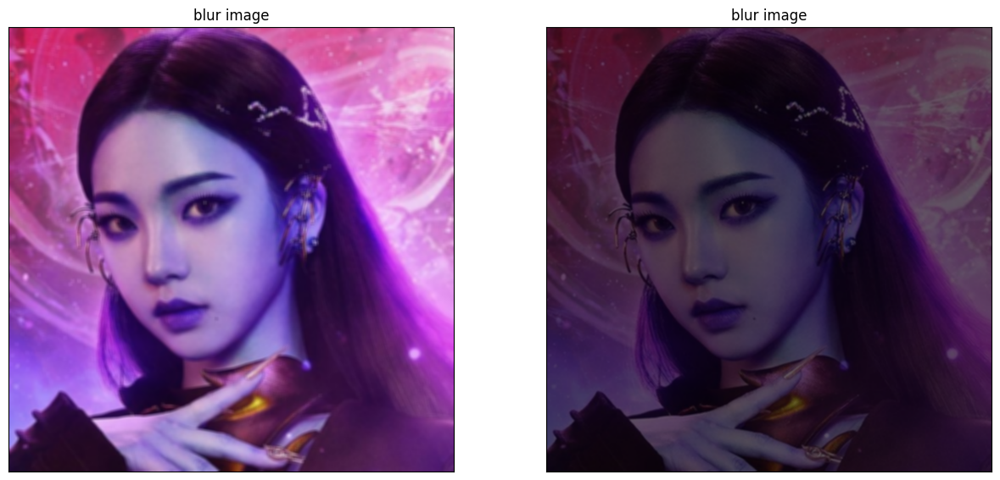

In [43]:
img = cv2.imread('karina.jpg')

# Konversi BGR ke RGB
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Buat kernel: matriks berukuran 3 x 5
kernel = np.ones((3, 5), np.float32) * 0.09
print(kernel)

# Lakukan filtering
filtered_img = cv2.filter2D(img, -1, kernel)

# perbesar ukuran hasil plotting jika diperlukan
plt.rcParams["figure.figsize"] = (15, 15)

# plot pertama, gambar asli
plt.subplot(121), plt.imshow(rgb_img), plt.title('Original')
plt.xticks([]), plt.yticks([])

# Ubah warna hasil filter menjadi asli (BGR)
filtered_rgb_img = cv2.cvtColor(filtered_img, cv2.COLOR_BGR2RGB)

# kedua, hasil filter
plt.subplot(122), plt.imshow(filtered_rgb_img), plt.title('Averaging')
plt.xticks([]), plt.yticks([])

# Plot!
plt.show()

blur = cv2.blur(img,(5,5))#Baris ini menghasilkan gambar yang telah di-blur menggunakan metode rata-rata dengan ukuran kernel 5x5.
plt.subplot(221), plt.imshow(blur), plt.title('blur image')
plt.xticks([]), plt.yticks([])

kernel = np.matrix([#: Baris ini mendefinisikan sebuah matriks kernel dengan ukuran 3x3. Kernel ini digunakan untuk filtering gambar dengan metode filter2D.
          [1, 1, 1],
          [1, 2, 1],
          [1, 1, 1]
          ])/25
print(kernel)#Baris ini mencetak matriks kernel ke konsol. Ini berguna untuk melihat nilai-nilai dalam matriks kernel.

# buat lagi filteringnya
filter = cv2.filter2D(img,-1,kernel)#Baris ini menerapkan operasi filter 2D pada gambar img menggunakan kernel yang telah ditentukan sebelumnya. -1 menunjukkan bahwa kedalaman gambar output harus sama dengan kedalaman gambar input.

# tampilkan
plt.subplot(222), plt.imshow(filter), plt.title('blur image')
plt.xticks([]), plt.yticks([])

Prak 7.7 Try

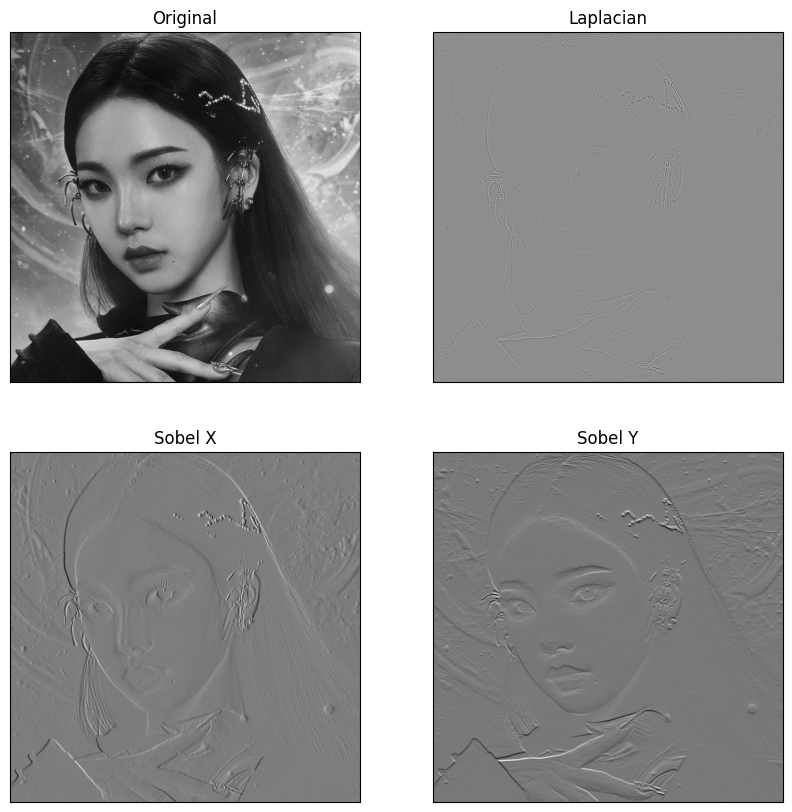

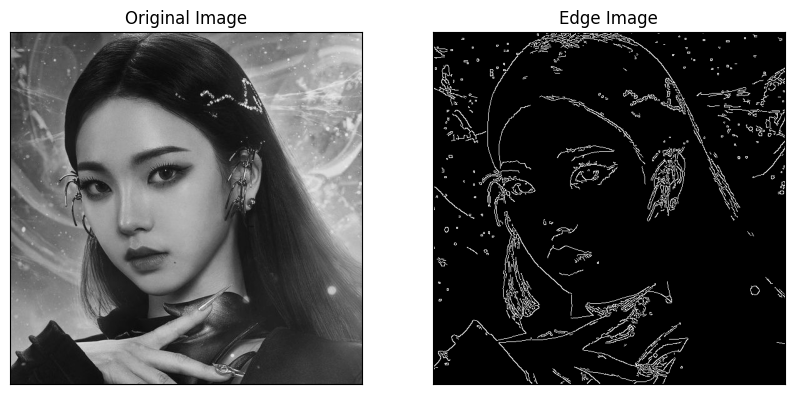

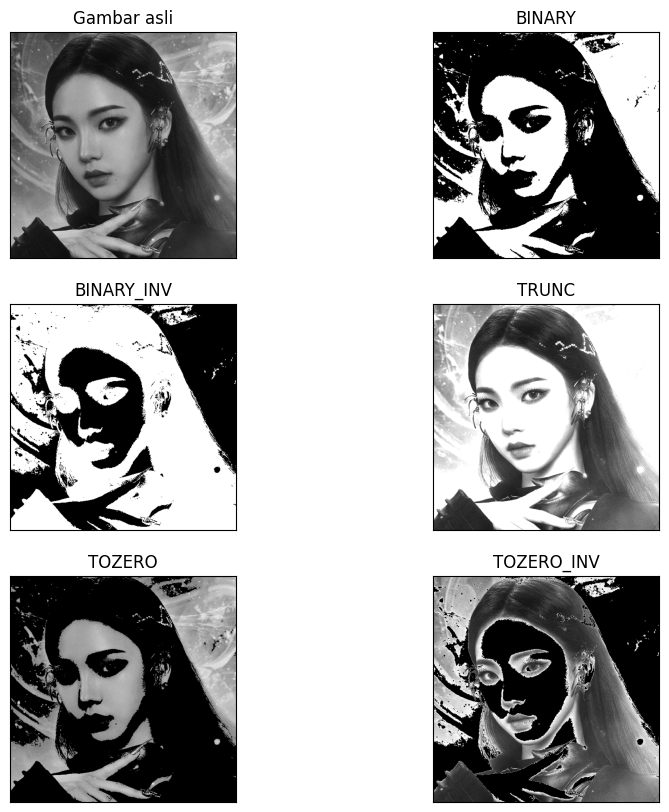

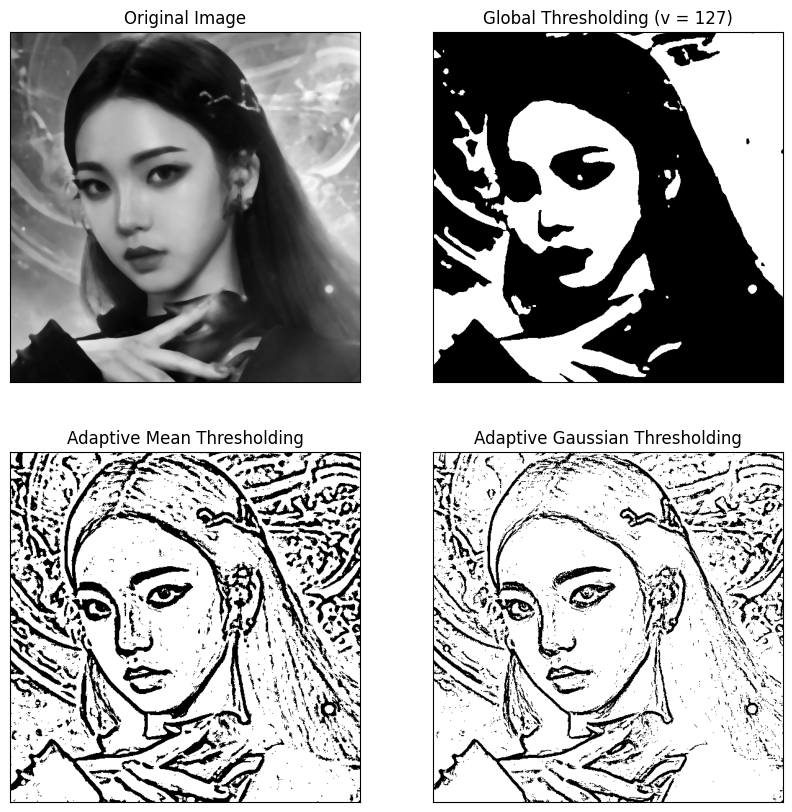

In [44]:
img = cv2.imread('karina.jpg',0)#Kode ini membaca gambar dengan nama 'aadc.jpeg' dan menyimpannya ke variabel img.

# menerapkan algoritma high-pass filtering:
# laplacian
laplacian = cv2.Laplacian(img,cv2.CV_64F)#Kode ini menerapkan filter Laplacian pada gambar grayscale img menggunakan fungsi cv2.Laplacian.

# sobel dengan ukuran kernel 3
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3)#Kode ini menerapkan filter Sobel pada gambar grayscale img menggunakan fungsi cv2.Sobel.
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)#Angka 1 dan 0 pada baris pertama menunjukkan bahwa filter diterapkan sepanjang sumbu x, sedangkan angka 0 dan 1 pada baris kedua menunjukkan bahwa filter diterapkan sepanjang sumbu y.

# perbesar ukuran hasil plotting
plt.rcParams["figure.figsize"] = (10,10)#Kode ini mengatur ukuran gambar plot menjadi (10, 10) menggunakan plt.rcParams.

# menampilkan hasil filter
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])#Kode ini membuat subplot dan menampilkan gambar grayscale asli. Argumen cmap='gray' menunjukkan bahwa colormap yang digunakan adalah grayscale.
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])#Kode ini membuat subplot lainnya dan menampilkan gambar setelah menerapkan filter Laplacian.
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])#Kode ini membuat subplot lainnya dan menampilkan gambar setelah menerapkan filter Sobel pada sumbu x.
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])#Kode ini membuat subplot lainnya dan menampilkan gambar setelah menerapkan filter Sobel pada sumbu x.
plt.show()

# memanggil citra sebagai grayscale (argument 0)
img = cv2.imread('karina.jpg',0)#Kode ini menampilkan plot dengan semua subplot yang telah dibuat.

# memanggil fungsi Canny Edges dengan argument (citra, nilai_min, nilai_max)
edges = cv2.Canny(img,100,200)#Kode ini mengaplikasikan metode Canny untuk mendeteksi tepi pada gambar img. Argumen 100 dan 200 menentukan threshold bawah dan atas untuk proses deteksi tepi. Hasilnya disimpan dalam variabel edges.

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])#Kode ini membuat subplot pertama dan menampilkan gambar asli. Argumen cmap='gray' menunjukkan bahwa colormap yang digunakan adalah grayscale.
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])#Kode ini membuat subplot kedua dan menampilkan gambar hasil deteksi tepi.

plt.show()#Kode ini menampilkan plot dengan kedua subplot yang telah dibuat.

# membaca gambar baymax
img = cv2.imread('karina.jpg',0)#Kode ini membaca gambar dengan nama 'aadc.jpeg' dan menyimpannya ke dalam variabel img.

# Hitungan threshold.
# Perhatikan nilai ambang batas bawah dan atas dari tiap fungsi
# yang diberikan
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)#Mengubah piksel dengan intensitas di atas ambang batas menjadi nilai maksimum (dalam hal ini 255) dan di bawah ambang batas menjadi nilai nol.
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)#mengubah piksel dengan intensitas di atas ambang batas menjadi nilai nol dan di bawah ambang batas menjadi nilai maksimum.
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)#Memotong (truncates) piksel yang memiliki intensitas di atas ambang batas menjadi ambang batas itu sendiri, sementara piksel dengan intensitas di bawah ambang batas tetap tidak berubah.
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)#Mengubah piksel dengan intensitas di atas ambang batas menjadi nilai intensitas itu sendiri, sedangkan piksel dengan intensitas di bawah ambang batas tetap tidak berubah.
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)#mengubah piksel dengan intensitas di atas ambang batas menjadi nilai nol, sementara piksel dengan intensitas di bawah ambang batas tetap tidak berubah.

# menampilkan hasil
titles = ['Gambar asli','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']#udul-judul disimpan dalam list titles,
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]#gambar-gambar (termasuk gambar asli dan hasil thresholding) disimpan dalam list images.

# menampilkan beberapa gambar sekaligus
for i in range(6):#Kode ini menggunakan loop for untuk membuat 6 subplot (3 baris, 2 kolom) dan menampilkan gambar-gambar hasil thresholding.
    # 3 baris, 2 kolom
    plt.subplot(3,2,i+1),plt.imshow(images[i],'gray')#. Pada setiap iterasi loop, i+1 digunakan sebagai nomor subplot. images[i] digunakan sebagai gambar yang akan ditampilkan dalam subplot tersebut,
    plt.title(titles[i])#titles[i] digunakan sebagai judul untuk setiap subplot.
    plt.xticks([]),plt.yticks([])#plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan penanda sumbu x dan y pada setiap subplot.
plt.show()#Kode ini menampilkan plot dengan semua subplot yang telah dibuat.

# masih menggunakan variabel img yang sama
#img = cv2.imread('images/baymax.jpg',0)

# digunakan median blur untuk menghaluskan tepi objek pada citra
# ini diperlukan agar thresholding memberikan hasil lebih baik
img = cv2.medianBlur(img,7)

# Lakukan Thresholding
# Binary Threshold
ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# Adaptive Threshold dengan Mean
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)

# Adaptive Threshold dengan Gaussian
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)


# Plotting
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

# menampilkan hasil
for i in range(4):#Kode ini menggunakan loop for untuk membuat 4 subplot (3 baris, 2 kolom)
    plt.subplot(2,2,i+1)#menampilkan gambar-gambar hasil thresholding. Pada setiap iterasi loop, i+1 digunakan sebagai nomor subplot.
    plt.imshow(images[i],'gray')#images[i] digunakan sebagai gambar yang akan ditampilkan dalam subplot tersebut, dengan colormap yang ditentukan sebagai 'gray' menggunakan 'gray'.
    plt.title(titles[i])#titles[i] digunakan sebagai judul untuk setiap subplot
    plt.xticks([]),plt.yticks([])#plt.xticks([]) dan plt.yticks([]) digunakan untuk menghilangkan penanda sumbu x dan y pada setiap subplot.
plt.show()#Kode ini menampilkan plot dengan semua subplot yang telah dibuat.